In [1]:
!pip3 install pycm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.3/70.3 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 599.8/599.8 kB 14.4 MB/s eta 0:00:00


In [2]:
from google.colab import drive
import warnings
import numpy as np
%matplotlib inline
import pandas as pd
import time
import seaborn as sn
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import StandardScaler, LabelEncoder, minmax_scale
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Nadam
from tensorflow.keras.utils import to_categorical
from pycm import *
from sklearn import svm
from matplotlib.pyplot import figure
import pickle

In [3]:
drive.mount('/content/drive')
warnings.filterwarnings('ignore')

Mounted at /content/drive


In [4]:
def load_and_preprocess_dataset(file_path, label_col_name, label_transformation=None):
    dataset = pd.read_csv(file_path, sep=',').drop('id', axis=1)
    feature_names = list(dataset.columns[:-1])
    features = dataset[feature_names].values

    labels = dataset[label_col_name].values
    if label_transformation:
        labels = label_transformation(labels)

    features = minmax_scale(features, axis=0)
    print(features)
    unique_classes = np.unique(labels)
    num_classes = len(unique_classes)
    return dataset, features, labels, feature_names, num_classes

def get_data(num):
    base_path = '/content/drive/MyDrive/'
    file_paths = ['Dataset1.csv', 'Dataset2.csv', 'Dataset3.csv']
    label_col_names = ['CLASS_LABEL', 'Result', 'Result']
    label_transformations = [None, lambda x: np.where(x == -1, 0, 1), lambda x: x + 1]

    dataset, features, labels, feature_names, num_classes = load_and_preprocess_dataset(
        base_path + file_paths[num - 1],
        label_col_names[num - 1],
        label_transformations[num - 1]
    )

    train, test, train_labels, test_labels = train_test_split(
        features, labels, test_size=0.3, random_state=np.random.seed(173)
    )

    return dataset, features, labels, feature_names, num_classes

In [5]:
def build_base_model(input_dimensions):
    model = Sequential()
    model.add(Dense(input_dimensions, input_dim=input_dimensions, kernel_initializer='normal', activation='relu'))
    model.add(Dense(50, kernel_initializer='normal', activation='relu'))
    return model

def initialize_neural_network(dataset, input_dimensions, num_classes):
    model = build_base_model(input_dimensions)
    if dataset == 1 or dataset == 2:
        model.add(Dense(1, kernel_initializer='normal', activation='tanh'))
        learning_rate = 0.002
        loss_function = 'mean_squared_error'
    elif dataset == 3:
        model.add(Dense(num_classes, kernel_initializer='normal', activation='softmax'))
        learning_rate = 0.001
        loss_function = 'categorical_crossentropy'

    optm = Nadam(learning_rate=learning_rate)
    model.compile(loss=loss_function, optimizer=optm, metrics=['accuracy'])
    model.save('model.h5')
    return model

In [6]:
def encode_labels(labels):
    encoder = LabelEncoder()
    encoder.fit(labels)
    encoded_labels = encoder.transform(labels)
    return to_categorical(encoded_labels)

def calculate_accuracy(conf_mat):
    return np.trace(conf_mat) / np.sum(conf_mat)

def evaluate_model(model, X, y, is_categorical):
    predictions = model.predict(X, verbose=0)
    if is_categorical:
        y_pred = np.argmax(predictions, axis=1)
        y_true = np.argmax(y, axis=1)
    else:
        y_pred = (predictions > 0.5).astype(int).flatten()
        y_true = y
    conf_mat = confusion_matrix(y_true, y_pred)
    return calculate_accuracy(conf_mat), conf_mat

In [7]:
def train_evaluate_Neural_Network(dataset, train, train_labels, test, test_labels):
    kf = StratifiedKFold(n_splits=5, random_state=np.random.seed(1))
    train_accuracy, validation_accuracy = [], []
    np.random.seed(1)
    start = time.time()
    is_categorical = dataset == 3

    for train_index, validation_index in kf.split(train, train_labels):
        X_train, X_validation = train[train_index], train[validation_index]
        y_train, y_validation = train_labels[train_index], train_labels[validation_index]

        if is_categorical:
            y_train = encode_labels(y_train)
            y_validation = encode_labels(y_validation)

        model = load_model('model.h5')
        model.fit(X_train, y_train, epochs=65, verbose=0)

        acc_train, _ = evaluate_model(model, X_train, y_train, is_categorical)
        train_accuracy.append(acc_train)

        acc_val, _ = evaluate_model(model, X_validation, y_validation, is_categorical)
        validation_accuracy.append(acc_val)

    end = time.time()
    print(f'Time to train Neural Network on Dataset {dataset} is: {end - start}')

    # Check and convert test_labels for multi-class classification
    if is_categorical and test_labels.ndim == 1:
        test_labels = encode_labels(test_labels)

    test_acc, test_conf_mat = evaluate_model(model, test, test_labels, is_categorical)

    dataset_3_confusion_mat = test_conf_mat if is_categorical else None

    yhat_classes_test = np.argmax(model.predict(test, verbose=0), axis=1) if is_categorical else (model.predict(test, verbose=0) > 0.5).astype(int).flatten()
    print("Unique Predicted Labels:", np.unique(yhat_classes_test))
    print("Unique True Labels:", np.unique(test_labels if not is_categorical else np.argmax(test_labels, axis=1)))
    print("Confusion Matrix Shape:", test_conf_mat.shape)

    return train_accuracy, validation_accuracy, test_acc, test_conf_mat, dataset_3_confusion_mat, yhat_classes_test


In [8]:
def get_classifier(classifier_name):
    if classifier_name == 'DecisionTree':
        return DecisionTreeClassifier(max_depth=30, criterion='gini')
    elif classifier_name == 'SVM':
        return svm.LinearSVC()
    elif classifier_name == 'RandomForest':
        return RandomForestClassifier(max_depth=30, criterion='gini')
    elif classifier_name == 'NaiveBayes':
        return GaussianNB()
    elif classifier_name == 'KNeighbors':
        return KNeighborsClassifier(n_neighbors=5, algorithm='auto')
    else:
        raise ValueError("Invalid classifier name")

def train_evaluate_ML_classifier(dataset, classifier_name, train, train_labels, test, test_labels):
    clf = get_classifier(classifier_name)
    kf = StratifiedKFold(n_splits=5, random_state=np.random.seed(1))
    train_accuracy, validation_accuracy = [], []
    np.random.seed(1)
    start = time.time()

    for train_index, validation_index in kf.split(train, train_labels):
        X_train, X_validation = train[train_index], train[validation_index]
        y_train, y_validation = train_labels[train_index], train_labels[validation_index]

        clf.fit(X_train, y_train)
        train_accuracy.append(clf.score(X_train, y_train))
        validation_accuracy.append(clf.score(X_validation, y_validation))

    end = time.time()
    print(f'Time to train {classifier_name} on Dataset {dataset} is: {end - start}')

    predictions = clf.predict(test)
    yhat_classes_test = np.argmax(predictions, axis=1) if predictions.ndim > 1 else (predictions > 0.5).astype(int).flatten()
    test_conf_mat = confusion_matrix(test_labels, yhat_classes_test)
    test_acc = np.trace(test_conf_mat) / np.sum(test_conf_mat)
    dataset_3_confusion_mat = test_conf_mat if dataset == 3 else None

    return train_accuracy, validation_accuracy, test_acc, test_conf_mat, dataset_3_confusion_mat, yhat_classes_test

In [9]:
def get_scores(conf_mat, true_labels, predictions, dataset):
    if conf_mat.shape == (2, 2):
        tn, fp, fn, tp = conf_mat.ravel()
        accuracy = (tp + tn) / float(tp + tn + fp + fn)
        precision = tp / float(tp + fp) if (tp + fp) != 0 else 0
        recall = tp / float(tp + fn) if (tp + fn) != 0 else 0
        f1_metric = 2 * precision * recall / (precision + recall) if (precision + recall) != 0 else 0
        specificity = tn / float(tn + fp) if (tn + fp) != 0 else 0
    else:
        accuracy = np.trace(conf_mat) / np.sum(conf_mat)
        precision = precision_score(true_labels, predictions, average='macro', labels=np.unique(predictions))
        recall = recall_score(true_labels, predictions, average='macro', labels=np.unique(predictions))
        f1_metric = f1_score(true_labels, predictions, average='macro', labels=np.unique(predictions))
        specificity = None

    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1_metric,
        'specificity': specificity
    }


In [10]:
def Get_PlotsNN(classifier, test_acc, specificity, precision, recall, f1_metric, confusion_matrix, dataset, plot_name):
    fig = figure(num=None, figsize=(20, 10), dpi=180, facecolor='w', edgecolor='k')

    # Plot 1: Train and Validation Accuracies
    plt.subplot(2, 2, 1)
    plt.ylim(0.2, 1.1)
    plt.xticks(range(5), ['1', '2', '3', '4', '5'])
    plt.plot(train_accuracy)
    plt.plot(validation_accuracy)
    plt.title('5-Fold Train and Validation Accuracies of ' + classifier + ' on Dataset ' + str(dataset))
    plt.ylabel('Accuracy')
    plt.xlabel('Fold')
    plt.legend(['Train Accuracy', 'Validation Accuracy'], loc='lower right')

    # Plot 2: Accuracies
    plt.subplot(2, 2, 2)
    objects = ('Train Accuracy', 'Validation Accuracy', 'Test Accuracy')
    y_pos = np.arange(len(objects))
    accuracy = [round(sum(train_accuracy)/5, 4), round(sum(validation_accuracy)/5, 4), round(test_acc, 4)]
    plt.ylim(0.2, 1.1)
    plt.bar(y_pos, accuracy, align='center', alpha=0.9)
    plt.xticks(y_pos, objects)
    plt.ylabel('Accuracy')
    plt.title('Train, Validation and Test Accuracies of ' + classifier + ' on Dataset ' + str(dataset))
    for a, b in zip(y_pos, accuracy):
        plt.text(a, b, str(b), size=10, ha='center', va='bottom', rotation=0)

    # Plot 3: Performance Metrics
    plt.subplot(2, 2, 3)
    metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
    values = [round(test_acc, 4), round(precision, 4), round(recall, 4), round(f1_metric, 4)]

    # Include specificity only if it's not None
    if specificity is not None:
        metrics.insert(1, 'Specificity')
        values.insert(1, round(specificity, 4))

    y_pos = np.arange(len(metrics))
    plt.ylim(0.2, 1.1)
    plt.bar(y_pos, values, align='center', alpha=0.9)
    plt.xticks(y_pos, metrics)
    plt.ylabel('Performance Scores')
    plt.title('Metrics of ' + classifier + ' on Dataset ' + str(dataset))
    for a, b in zip(y_pos, values):
        plt.text(a, b, str(b), size=10, ha='center', va='bottom', rotation=0)

    # Plot 4: Confusion Matrix
    plt.subplot(2, 2, 4)
    plt.title(classifier + "'s Confusion Matrix")

    # Dynamically determine labels for the confusion matrix
    num_labels = confusion_matrix.shape[0]
   # Adjusting the DataFrame creation based on dataset
    if dataset == 1:
        df_cm = pd.DataFrame(confusion_matrix, columns=['Legitimate', 'Phishing'], index=['Legitimate', 'Phishing'])
    elif dataset == 2:
        df_cm = pd.DataFrame(confusion_matrix, columns=['Phishing', 'Legitimate'], index=['Phishing', 'Legitimate'])
    elif dataset == 3:
        # Ensure the confusion matrix has the correct shape for 3 classes
        if confusion_matrix.shape == (3, 3):
            df_cm = pd.DataFrame(confusion_matrix, columns=['Phishing', 'Suspicious', 'Legitimate'], index=['Phishing', 'Suspicious', 'Legitimate'])
        else:
            print("Dataset 3: ", confusion_matrix.shape())
            raise ValueError("Dataset 3 confusion matrix should have shape (3,3)")
    df_cm.index.name = 'Actual'
    df_cm.columns.name = 'Predicted'
    sn.set(font_scale=1.4)  # For label size
    sn.heatmap(df_cm, cmap="Blues", annot=True, annot_kws={"size": 16}, fmt='g')  # Font size

    plt.tight_layout(pad=0.8, w_pad=0.8, h_pad=2.0)
    plt.show()
    fig.savefig(plot_name + '.jpg')

In [11]:
def RecursiveFeatureElimination(features, labels, feature_names_dataset):
    np.random.seed(1)
    dtc = RandomForestClassifier(criterion = "gini", max_depth=10)
    rfecv = RFECV(estimator=dtc, step=1, cv=StratifiedKFold(5),
                  scoring='accuracy')
    rfecv.fit(features, labels)
    arr = rfecv.ranking_
    names = []
    j=1
    for i in range (len(arr)):
        if arr[i] == 1:
            names.append(feature_names_dataset[i])
    return names, rfecv

In [12]:
def train_best_model_and_save_pickle(model_name, dataset_number):
    # Load the dataset
    dataset, features, labels, feature_names, num_classes = get_data(dataset_number)
    train, test, train_labels, test_labels = train_test_split(features, labels, test_size=0.3, random_state=np.random.seed(173))

    # Initialize and train the model
    if model_name == 'Neural Network':
        input_dimensions = train.shape[1]
        model = initialize_neural_network(dataset_number, input_dimensions, num_classes)
        train_evaluate_Neural_Network(dataset_number, train, train_labels, test, test_labels)
    else:
        train_evaluate_ML_classifier(dataset_number, model_name, train, train_labels, test, test_labels)
        model = get_classifier(model_name)
        model.fit(train, train_labels)

    # Save the model to a pickle file
    with open(f'{model_name}_Dataset_{dataset_number}.pickle', 'wb') as file:
        pickle.dump(model, file)
    print(f"Model {model_name} for Dataset {dataset_number} saved as pickle file.")

def print_best_model(df):
    best_model_row = df.loc[df['f1_score'].idxmax()]

    print("Best Model:")
    print("-----------")
    print(f"Model: {best_model_row['model']}")
    print(f"Dataset: {best_model_row['dataset']}")
    print(f"F1 Score: {best_model_row['f1_score']:.4f}")

    return best_model_row['model'], best_model_row['dataset']


Training DecisionTree on Dataset 1...
[[0.1        0.07142857 0.27777778 ... 1.         0.         1.        ]
 [0.1        0.07142857 0.16666667 ... 1.         1.         1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         0.         0.5       ]
 ...
 [0.05       0.07142857 0.22222222 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.05555556 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         1.         1.        ]]
Time to train DecisionTree on Dataset 1 is: 0.2343766689300537


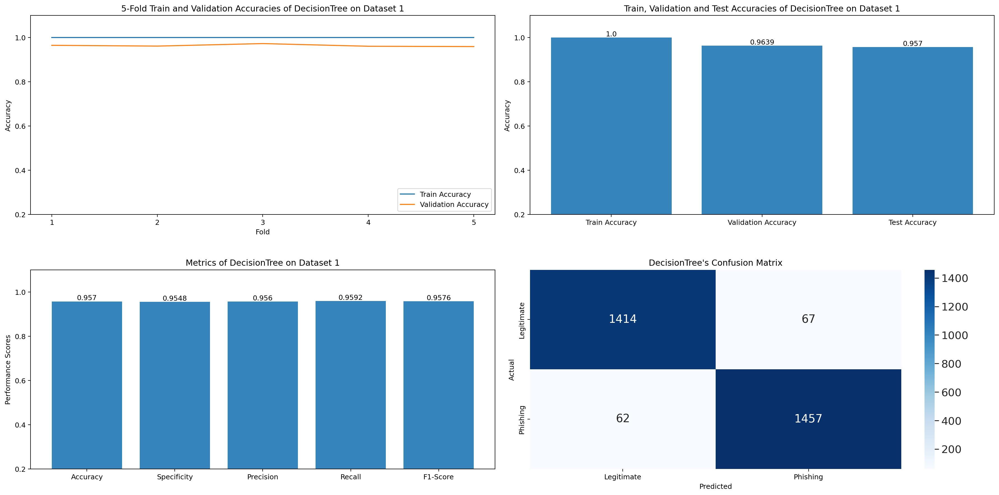


Training SVM on Dataset 1...
[[0.1        0.07142857 0.27777778 ... 1.         0.         1.        ]
 [0.1        0.07142857 0.16666667 ... 1.         1.         1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         0.         0.5       ]
 ...
 [0.05       0.07142857 0.22222222 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.05555556 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         1.         1.        ]]
Time to train SVM on Dataset 1 is: 0.4947657585144043


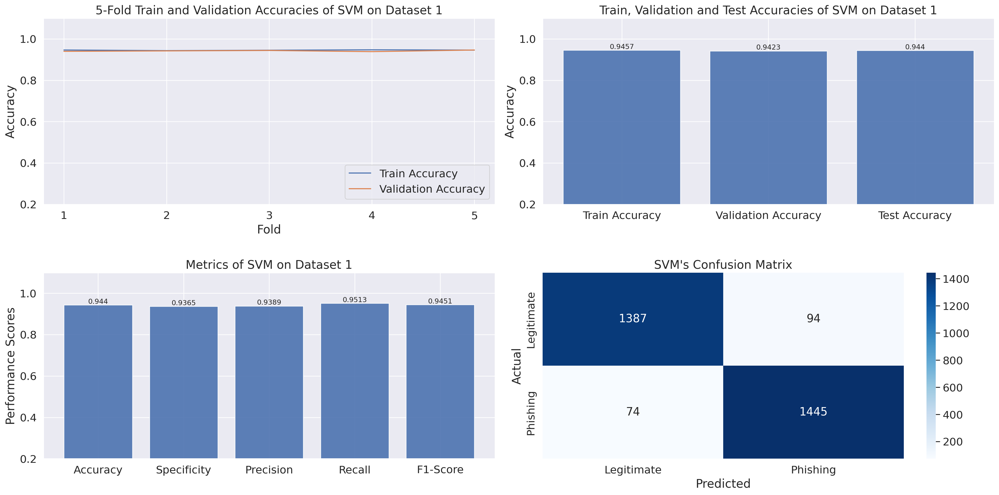


Training RandomForest on Dataset 1...
[[0.1        0.07142857 0.27777778 ... 1.         0.         1.        ]
 [0.1        0.07142857 0.16666667 ... 1.         1.         1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         0.         0.5       ]
 ...
 [0.05       0.07142857 0.22222222 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.05555556 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         1.         1.        ]]
Time to train RandomForest on Dataset 1 is: 3.207289934158325


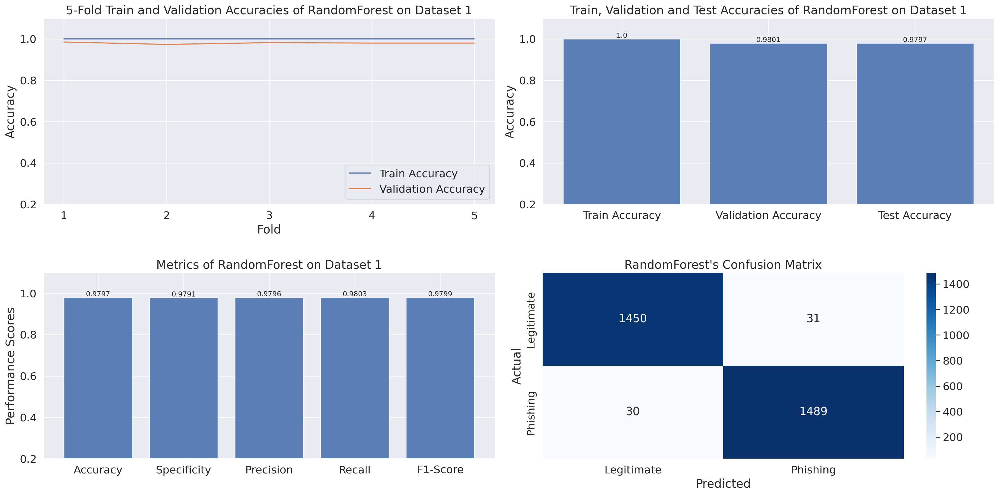


Training NaiveBayes on Dataset 1...
[[0.1        0.07142857 0.27777778 ... 1.         0.         1.        ]
 [0.1        0.07142857 0.16666667 ... 1.         1.         1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         0.         0.5       ]
 ...
 [0.05       0.07142857 0.22222222 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.05555556 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         1.         1.        ]]
Time to train NaiveBayes on Dataset 1 is: 0.05588960647583008


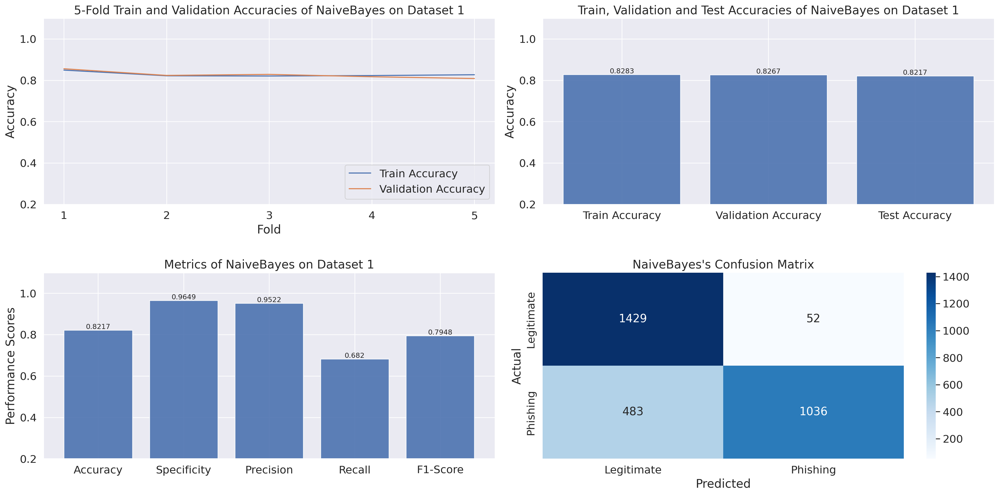


Training KNeighbors on Dataset 1...
[[0.1        0.07142857 0.27777778 ... 1.         0.         1.        ]
 [0.1        0.07142857 0.16666667 ... 1.         1.         1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         0.         0.5       ]
 ...
 [0.05       0.07142857 0.22222222 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.05555556 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         1.         1.        ]]
Time to train KNeighbors on Dataset 1 is: 2.1255078315734863


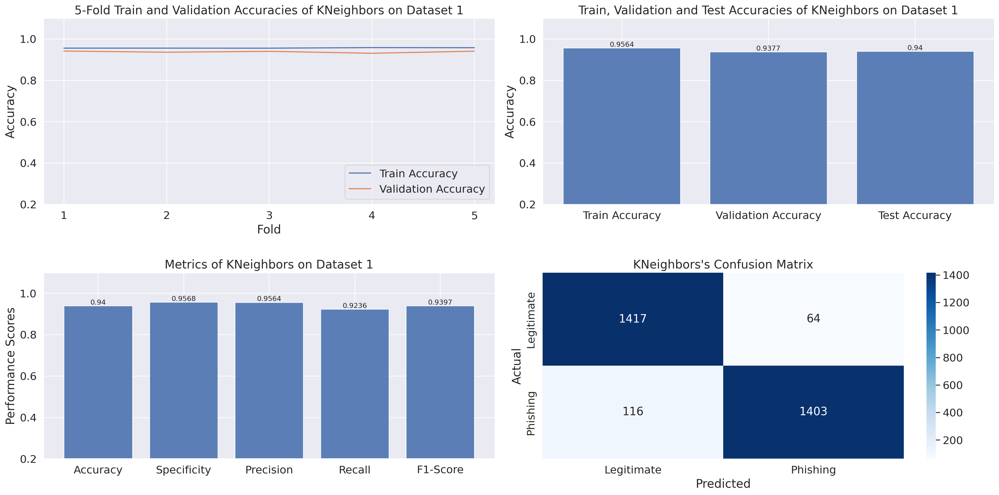


Training Neural Network on Dataset 1...
[[0.1        0.07142857 0.27777778 ... 1.         0.         1.        ]
 [0.1        0.07142857 0.16666667 ... 1.         1.         1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         0.         0.5       ]
 ...
 [0.05       0.07142857 0.22222222 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.05555556 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         1.         1.        ]]
Time to train Neural Network on Dataset 1 is: 138.9141685962677
Unique Predicted Labels: [0 1]
Unique True Labels: [0 1]
Confusion Matrix Shape: (2, 2)


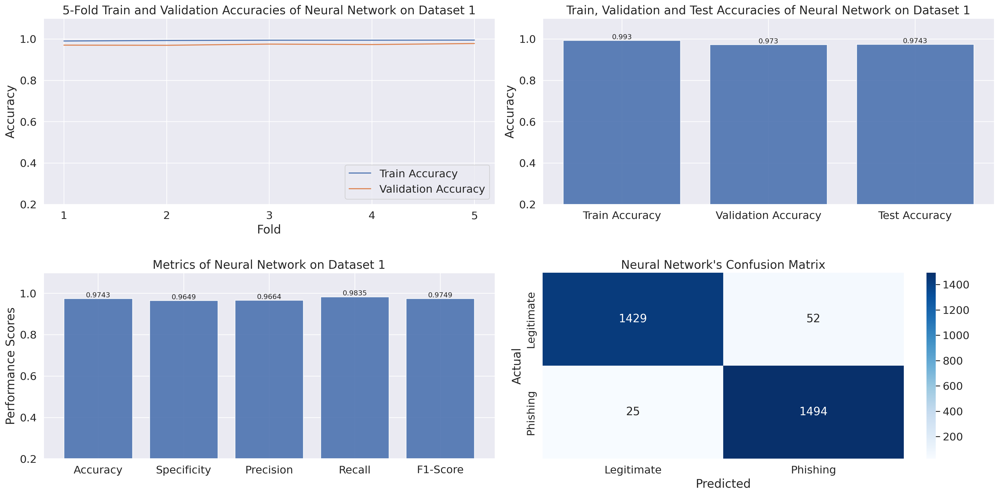




Training DecisionTree on Dataset 2...
[[0.  1.  1.  ... 1.  1.  0. ]
 [1.  1.  1.  ... 1.  1.  1. ]
 [1.  0.5 1.  ... 1.  0.5 0. ]
 ...
 [1.  0.  1.  ... 1.  0.5 1. ]
 [0.  0.  1.  ... 1.  1.  1. ]
 [0.  0.  1.  ... 0.  1.  0. ]]
Time to train DecisionTree on Dataset 2 is: 0.07359933853149414


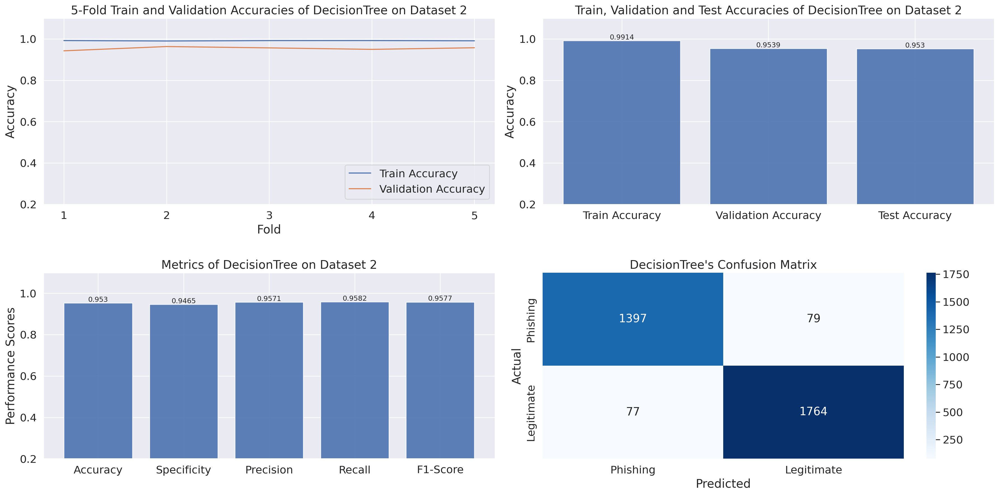


Training SVM on Dataset 2...
[[0.  1.  1.  ... 1.  1.  0. ]
 [1.  1.  1.  ... 1.  1.  1. ]
 [1.  0.5 1.  ... 1.  0.5 0. ]
 ...
 [1.  0.  1.  ... 1.  0.5 1. ]
 [0.  0.  1.  ... 1.  1.  1. ]
 [0.  0.  1.  ... 0.  1.  0. ]]
Time to train SVM on Dataset 2 is: 0.9138309955596924


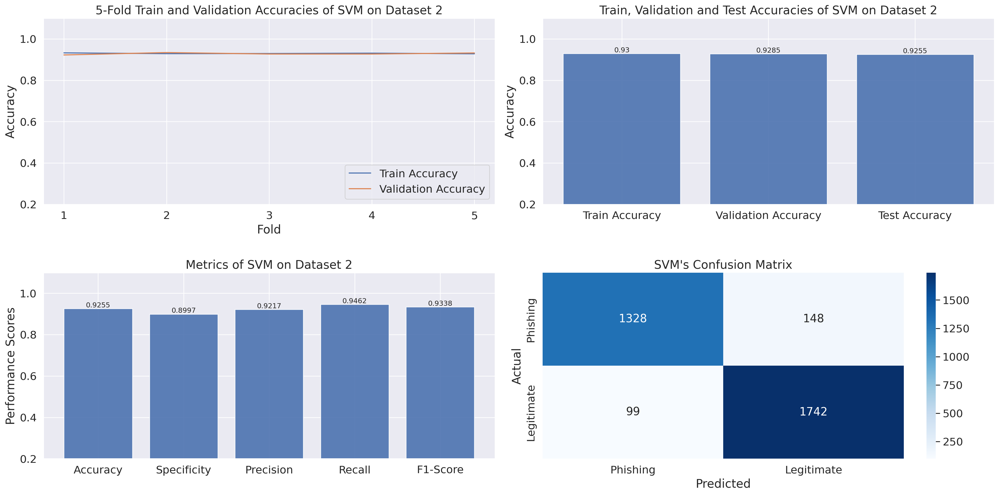


Training RandomForest on Dataset 2...
[[0.  1.  1.  ... 1.  1.  0. ]
 [1.  1.  1.  ... 1.  1.  1. ]
 [1.  0.5 1.  ... 1.  0.5 0. ]
 ...
 [1.  0.  1.  ... 1.  0.5 1. ]
 [0.  0.  1.  ... 1.  1.  1. ]
 [0.  0.  1.  ... 0.  1.  0. ]]
Time to train RandomForest on Dataset 2 is: 2.626312255859375


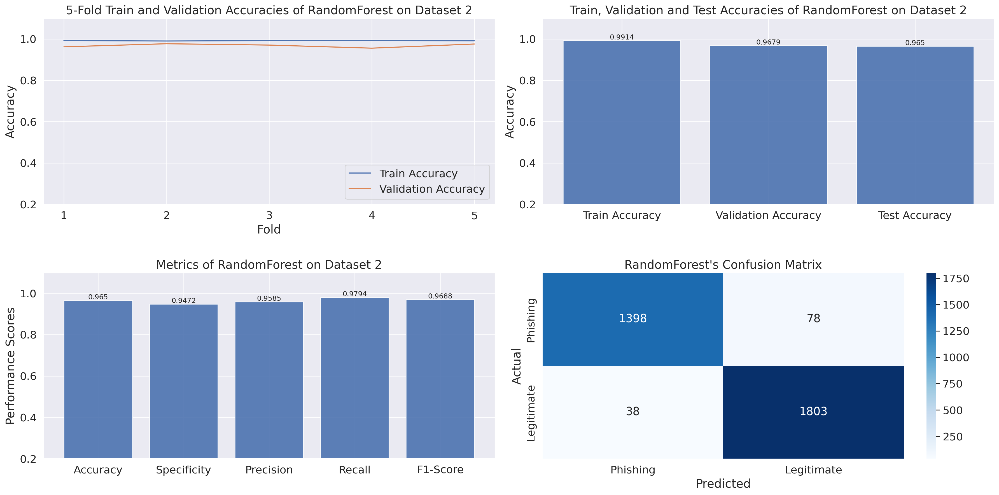


Training NaiveBayes on Dataset 2...
[[0.  1.  1.  ... 1.  1.  0. ]
 [1.  1.  1.  ... 1.  1.  1. ]
 [1.  0.5 1.  ... 1.  0.5 0. ]
 ...
 [1.  0.  1.  ... 1.  0.5 1. ]
 [0.  0.  1.  ... 1.  1.  1. ]
 [0.  0.  1.  ... 0.  1.  0. ]]
Time to train NaiveBayes on Dataset 2 is: 0.04342055320739746


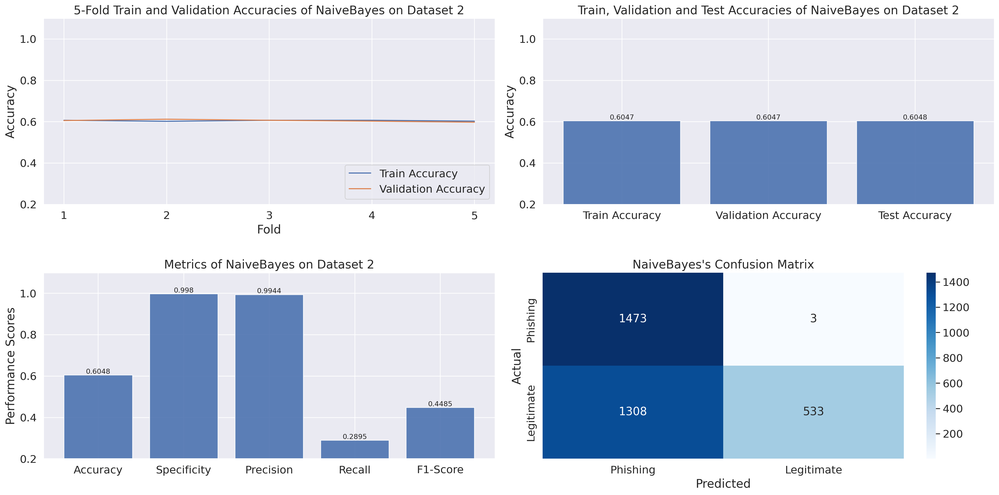


Training KNeighbors on Dataset 2...
[[0.  1.  1.  ... 1.  1.  0. ]
 [1.  1.  1.  ... 1.  1.  1. ]
 [1.  0.5 1.  ... 1.  0.5 0. ]
 ...
 [1.  0.  1.  ... 1.  0.5 1. ]
 [0.  0.  1.  ... 1.  1.  1. ]
 [0.  0.  1.  ... 0.  1.  0. ]]
Time to train KNeighbors on Dataset 2 is: 2.4013166427612305


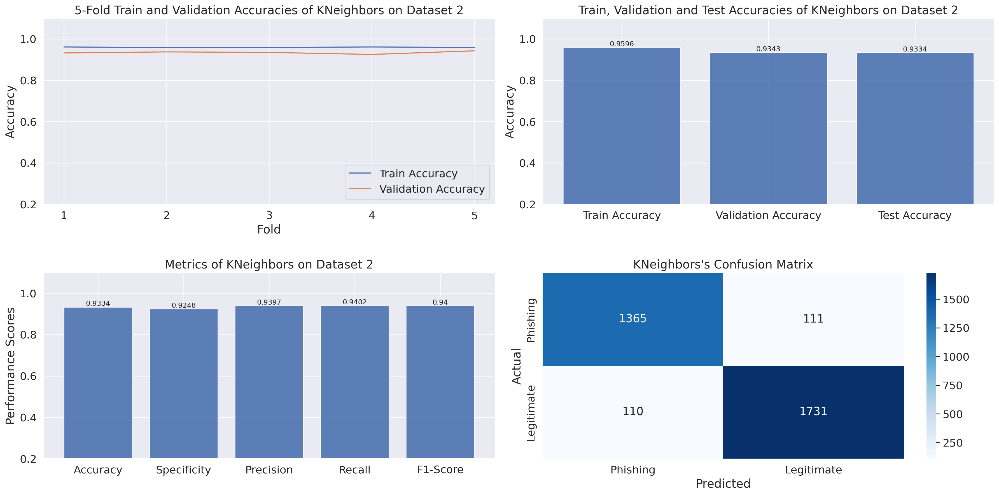


Training Neural Network on Dataset 2...
[[0.  1.  1.  ... 1.  1.  0. ]
 [1.  1.  1.  ... 1.  1.  1. ]
 [1.  0.5 1.  ... 1.  0.5 0. ]
 ...
 [1.  0.  1.  ... 1.  0.5 1. ]
 [0.  0.  1.  ... 1.  1.  1. ]
 [0.  0.  1.  ... 0.  1.  0. ]]
Time to train Neural Network on Dataset 2 is: 168.54940962791443
Unique Predicted Labels: [0 1]
Unique True Labels: [0 1]
Confusion Matrix Shape: (2, 2)


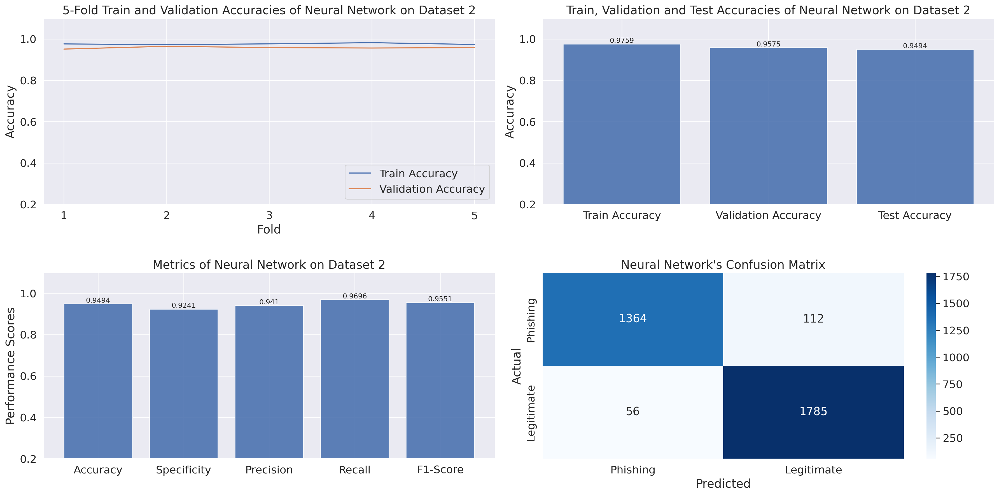




Training DecisionTree on Dataset 3...
[[1.  0.  1.  ... 1.  1.  0. ]
 [0.  0.  0.  ... 1.  1.  1. ]
 [1.  0.  0.5 ... 0.  1.  0. ]
 ...
 [0.  0.5 0.  ... 0.  0.  0. ]
 [0.5 0.5 1.  ... 0.  1.  0. ]
 [1.  0.5 1.  ... 0.  0.  0. ]]
Time to train DecisionTree on Dataset 3 is: 0.012033462524414062


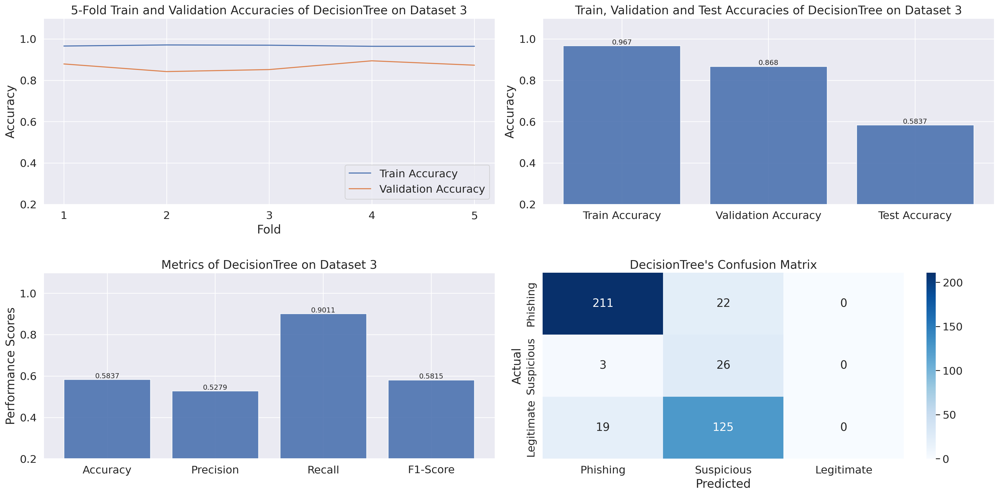


Training SVM on Dataset 3...
[[1.  0.  1.  ... 1.  1.  0. ]
 [0.  0.  0.  ... 1.  1.  1. ]
 [1.  0.  0.5 ... 0.  1.  0. ]
 ...
 [0.  0.5 0.  ... 0.  0.  0. ]
 [0.5 0.5 1.  ... 0.  1.  0. ]
 [1.  0.5 1.  ... 0.  0.  0. ]]
Time to train SVM on Dataset 3 is: 0.061843156814575195


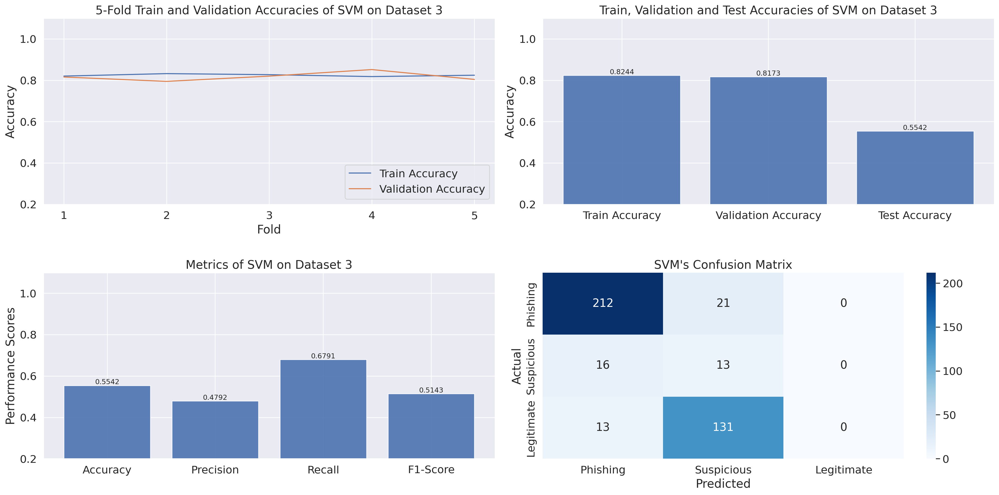


Training RandomForest on Dataset 3...
[[1.  0.  1.  ... 1.  1.  0. ]
 [0.  0.  0.  ... 1.  1.  1. ]
 [1.  0.  0.5 ... 0.  1.  0. ]
 ...
 [0.  0.5 0.  ... 0.  0.  0. ]
 [0.5 0.5 1.  ... 0.  1.  0. ]
 [1.  0.5 1.  ... 0.  0.  0. ]]
Time to train RandomForest on Dataset 3 is: 0.9808268547058105


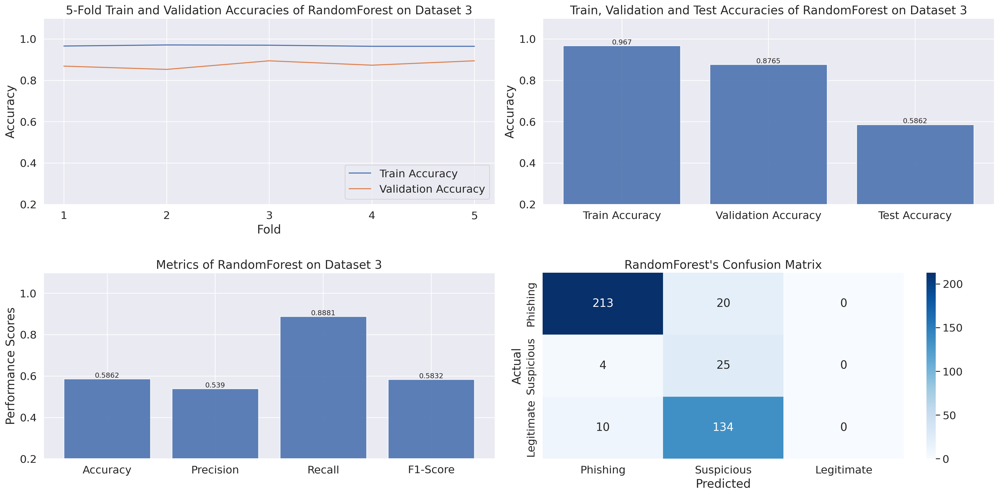


Training NaiveBayes on Dataset 3...
[[1.  0.  1.  ... 1.  1.  0. ]
 [0.  0.  0.  ... 1.  1.  1. ]
 [1.  0.  0.5 ... 0.  1.  0. ]
 ...
 [0.  0.5 0.  ... 0.  0.  0. ]
 [0.5 0.5 1.  ... 0.  1.  0. ]
 [1.  0.5 1.  ... 0.  0.  0. ]]
Time to train NaiveBayes on Dataset 3 is: 0.014025211334228516


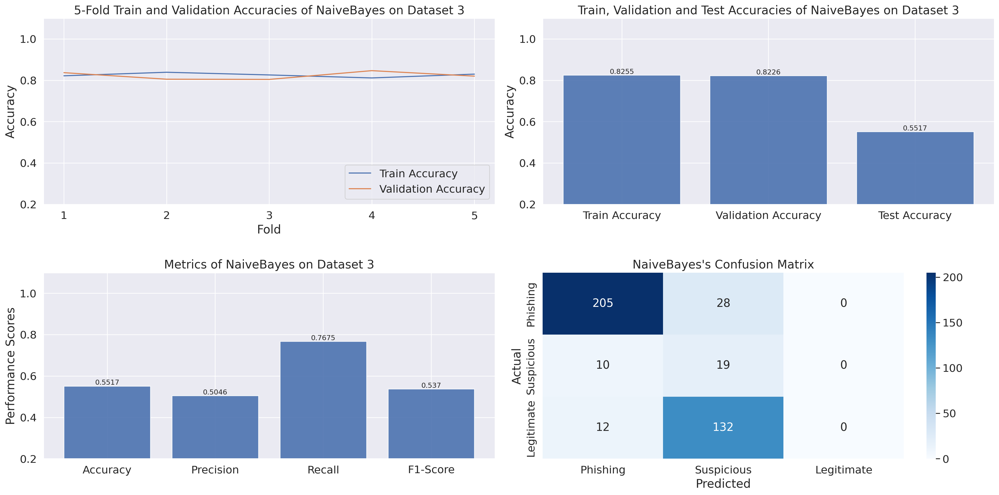


Training KNeighbors on Dataset 3...
[[1.  0.  1.  ... 1.  1.  0. ]
 [0.  0.  0.  ... 1.  1.  1. ]
 [1.  0.  0.5 ... 0.  1.  0. ]
 ...
 [0.  0.5 0.  ... 0.  0.  0. ]
 [0.5 0.5 1.  ... 0.  1.  0. ]
 [1.  0.5 1.  ... 0.  0.  0. ]]
Time to train KNeighbors on Dataset 3 is: 0.2953002452850342


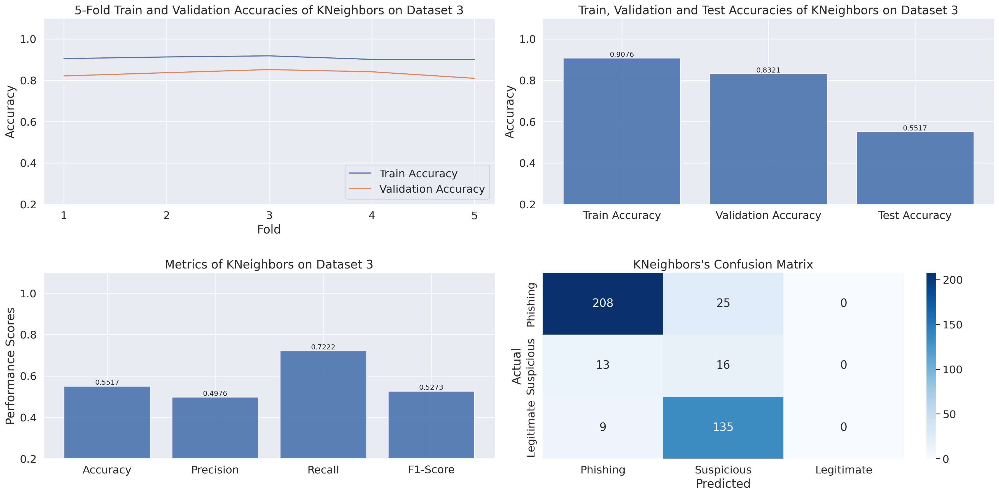


Training Neural Network on Dataset 3...
[[1.  0.  1.  ... 1.  1.  0. ]
 [0.  0.  0.  ... 1.  1.  1. ]
 [1.  0.  0.5 ... 0.  1.  0. ]
 ...
 [0.  0.5 0.  ... 0.  0.  0. ]
 [0.5 0.5 1.  ... 0.  1.  0. ]
 [1.  0.5 1.  ... 0.  0.  0. ]]
Time to train Neural Network on Dataset 3 is: 28.795220375061035
Unique Predicted Labels: [0 1 2]
Unique True Labels: [0 1 2]
Confusion Matrix Shape: (3, 3)


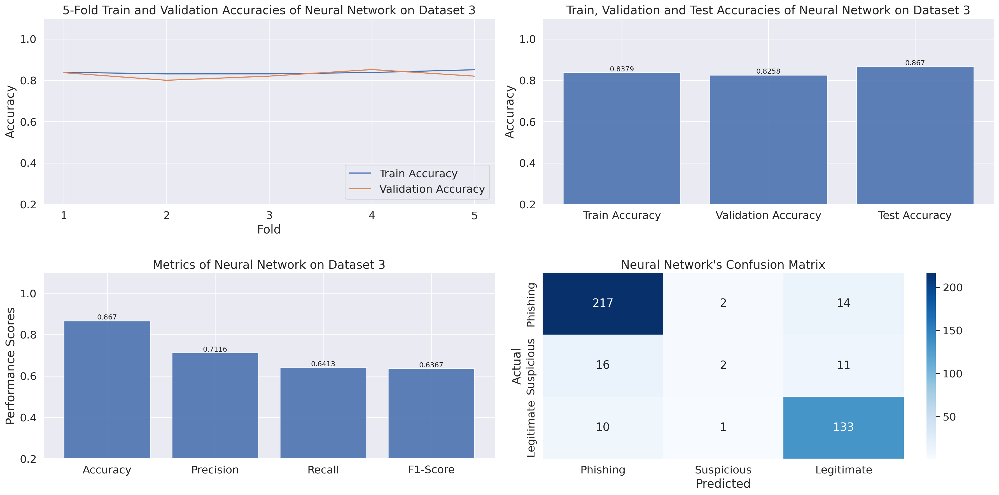



Best Model:
-----------
Model: RandomForest
Dataset: 1
F1 Score: 0.9799
[[0.1        0.07142857 0.27777778 ... 1.         0.         1.        ]
 [0.1        0.07142857 0.16666667 ... 1.         1.         1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         0.         0.5       ]
 ...
 [0.05       0.07142857 0.22222222 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.05555556 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         1.         1.        ]]
Time to train RandomForest on Dataset 1 is: 3.143449068069458
Model RandomForest for Dataset 1 saved as pickle file.


In [13]:
# Global variables
train_accuracy = []
validation_accuracy = []
selected_features_1 = []
selected_features_2 = []
selected_features_3 = []
test_confusion_matrix = None
plot_name = ''

def train_and_evaluate_classifier(classifier, dataset_number):
    global train_accuracy, validation_accuracy, test_confusion_matrix, plot_name

    # Load and prepare the dataset
    dataset, features_dataset, labels_dataset, feature_names_dataset, num_classes = get_data(dataset_number)
    train, test, train_labels, test_labels = train_test_split(features_dataset, labels_dataset, test_size=0.3, random_state=np.random.seed(173))

    # Initialize and train the model
    if classifier == 'Neural Network':
        input_dimensions = train.shape[1]
        model = initialize_neural_network(dataset_number, input_dimensions, num_classes)
        train_accuracy, validation_accuracy, test_acc, test_conf_mat, dataset_3_confusion_mat, predictions = train_evaluate_Neural_Network(dataset_number, train, train_labels, test, test_labels)
    else:
        train_accuracy, validation_accuracy, test_acc, test_conf_mat, dataset_3_confusion_mat, predictions = train_evaluate_ML_classifier(dataset_number, classifier, train, train_labels, test, test_labels)

    # Evaluate the model
    metrics = get_scores(test_conf_mat, test_labels, predictions, dataset_number)
    test_acc = metrics['accuracy']
    specificity = metrics['specificity']
    precision = metrics['precision']
    recall = metrics['recall']
    f1_metric = metrics['f1_score']

    # Update global test confusion matrix
    test_confusion_matrix = test_conf_mat if dataset_number != 3 else dataset_3_confusion_mat

    # Generate performance plots
    plot_name = classifier + '_without_feature_selection_on_Dataset_' + str(dataset_number)
    Get_PlotsNN(classifier, test_acc, specificity, precision, recall, f1_metric, test_confusion_matrix, dataset_number, plot_name)
    return metrics

def main():
    np.random.seed(1)
    classifiers = ['DecisionTree', 'SVM', 'RandomForest', 'NaiveBayes', 'KNeighbors', 'Neural Network']
    performance_metrics = []

    for i in range(1, 4):  # Adjust the range as needed for multiple datasets
        for classifier in classifiers:
            print(f'\nTraining {classifier} on Dataset {i}...')
            metrics = train_and_evaluate_classifier(classifier, i)
            metrics['model'] = classifier
            metrics['dataset'] = i
            performance_metrics.append(metrics)
        print('\n')

    # Convert to DataFrame for easier comparison
    df = pd.DataFrame(performance_metrics)
    model_name, dataset_number = print_best_model(df)
    train_best_model_and_save_pickle(model_name, dataset_number)

if __name__ == "__main__":
    main()


In [14]:
def train_and_evaluate_with_rfe(classifier, dataset_number, train, train_labels, test, test_labels, num_classes, num_features):
    # Initialize and train the model
    if classifier == 'Neural Network':
        model = initialize_neural_network(dataset_number, num_features, num_classes)
        train_accuracy, validation_accuracy, test_acc, test_conf_mat, dataset_3_confusion_mat, predictions = train_evaluate_Neural_Network(dataset_number, train, train_labels, test, test_labels)
    else:
        train_accuracy, validation_accuracy, test_acc, test_conf_mat, dataset_3_confusion_mat, predictions = train_evaluate_ML_classifier(dataset_number, classifier, train, train_labels, test, test_labels)

    # Evaluate the model and get scores
    metrics = get_scores(test_conf_mat, test_labels, predictions, dataset_number)
    plot_name = classifier + '_with_Recursive_Feature_Elimination_on_Dataset_' + str(dataset_number)
    test_confusion_matrix = test_conf_mat if dataset_number != 3 else dataset_3_confusion_mat

    # Plot the results (this function remains as it is)
    Get_PlotsNN(classifier, metrics['accuracy'], metrics['specificity'], metrics['precision'], metrics['recall'], metrics['f1_score'], test_confusion_matrix, dataset_number, plot_name)

    # Return the metrics
    return metrics


[[0.1        0.07142857 0.27777778 ... 1.         0.         1.        ]
 [0.1        0.07142857 0.16666667 ... 1.         1.         1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         0.         0.5       ]
 ...
 [0.05       0.07142857 0.22222222 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.05555556 ... 1.         0.5        1.        ]
 [0.1        0.07142857 0.11111111 ... 1.         1.         1.        ]]

Number of features selected by Recursive Feature Elimination for Dataset 1: 39


Training DecisionTree on Dataset 1 with RFE...
Time to train DecisionTree on Dataset 1 is: 0.20057463645935059


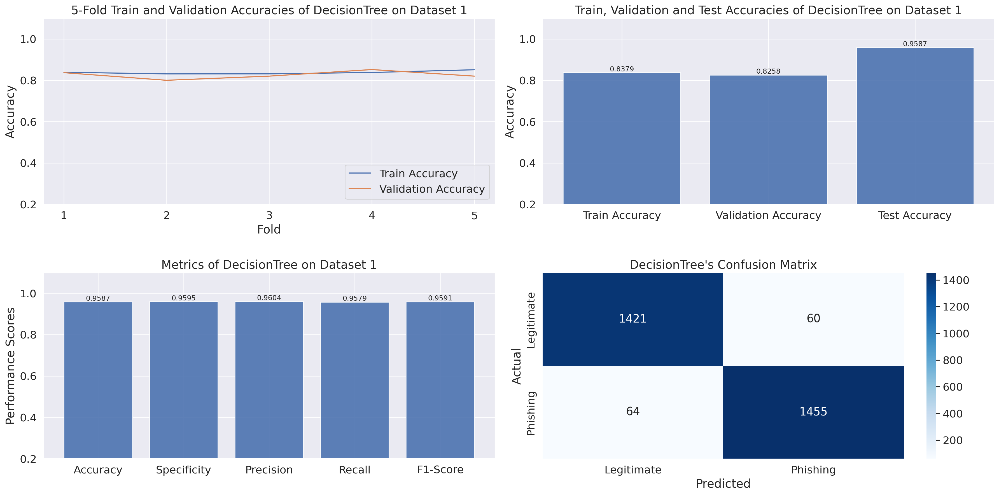


Training SVM on Dataset 1 with RFE...
Time to train SVM on Dataset 1 is: 2.40624737739563


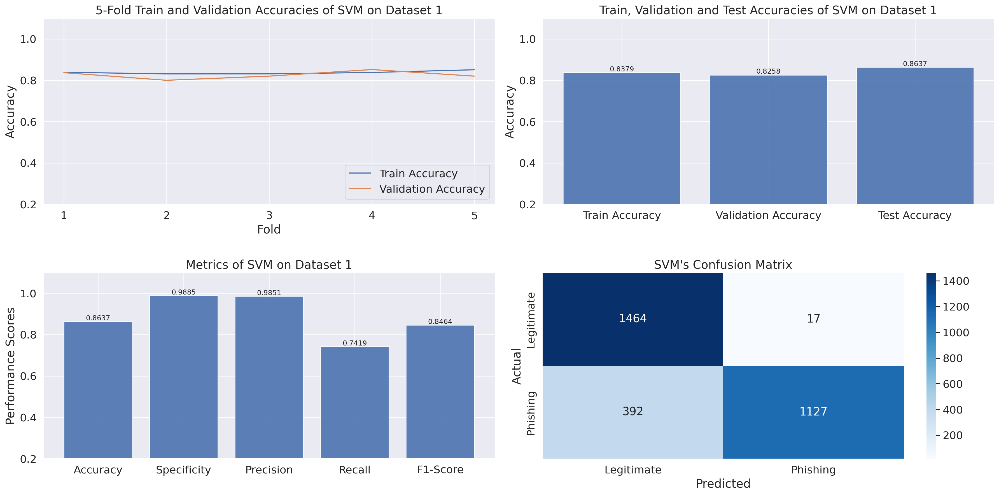


Training RandomForest on Dataset 1 with RFE...
Time to train RandomForest on Dataset 1 is: 3.393805503845215


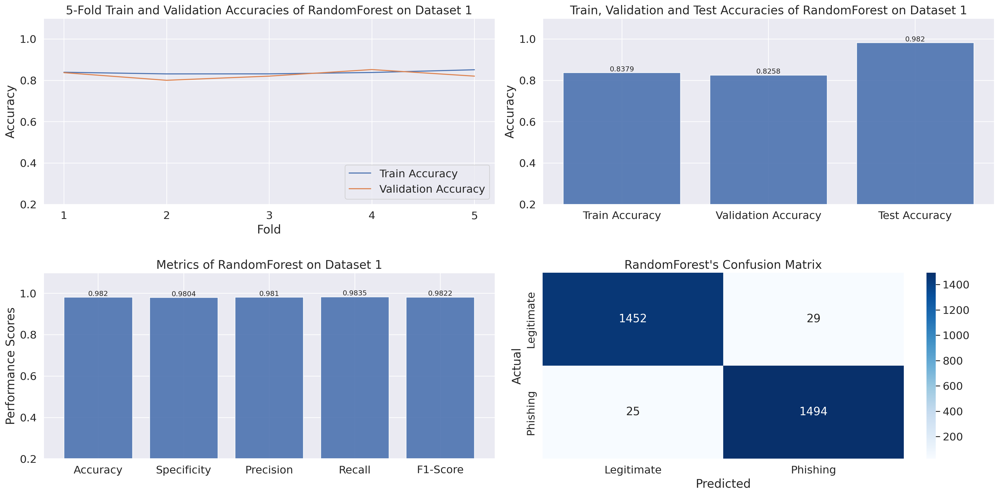


Training NaiveBayes on Dataset 1 with RFE...
Time to train NaiveBayes on Dataset 1 is: 0.048625946044921875


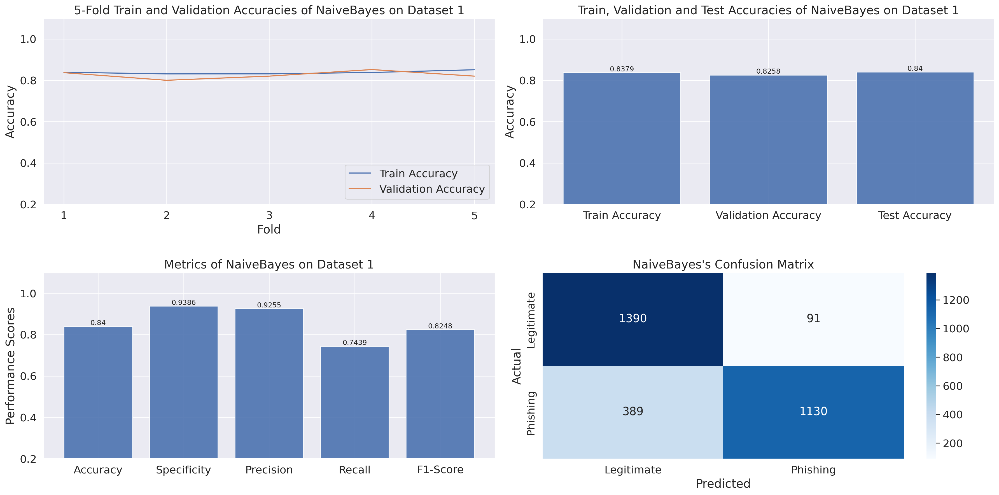


Training KNeighbors on Dataset 1 with RFE...
Time to train KNeighbors on Dataset 1 is: 2.0249526500701904


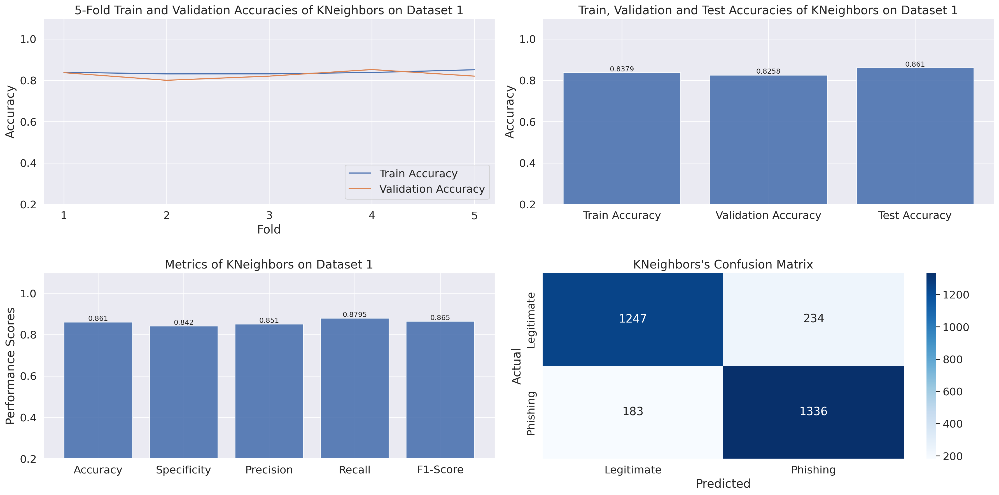


Training Neural Network on Dataset 1 with RFE...
Time to train Neural Network on Dataset 1 is: 138.73770189285278
Unique Predicted Labels: [0 1]
Unique True Labels: [0 1]
Confusion Matrix Shape: (2, 2)


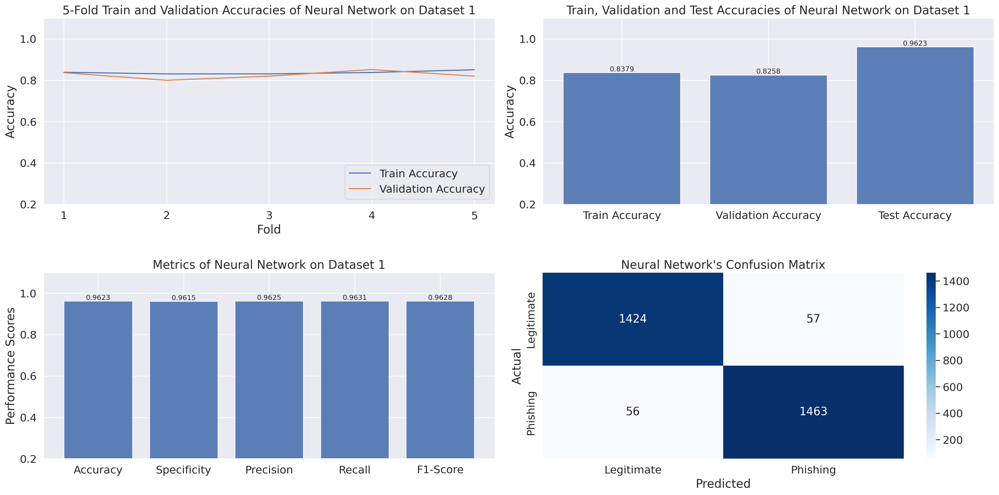

[[0.  1.  1.  ... 1.  1.  0. ]
 [1.  1.  1.  ... 1.  1.  1. ]
 [1.  0.5 1.  ... 1.  0.5 0. ]
 ...
 [1.  0.  1.  ... 1.  0.5 1. ]
 [0.  0.  1.  ... 1.  1.  1. ]
 [0.  0.  1.  ... 0.  1.  0. ]]

Number of features selected by Recursive Feature Elimination for Dataset 2: 17


Training DecisionTree on Dataset 2 with RFE...
Time to train DecisionTree on Dataset 2 is: 0.05543088912963867


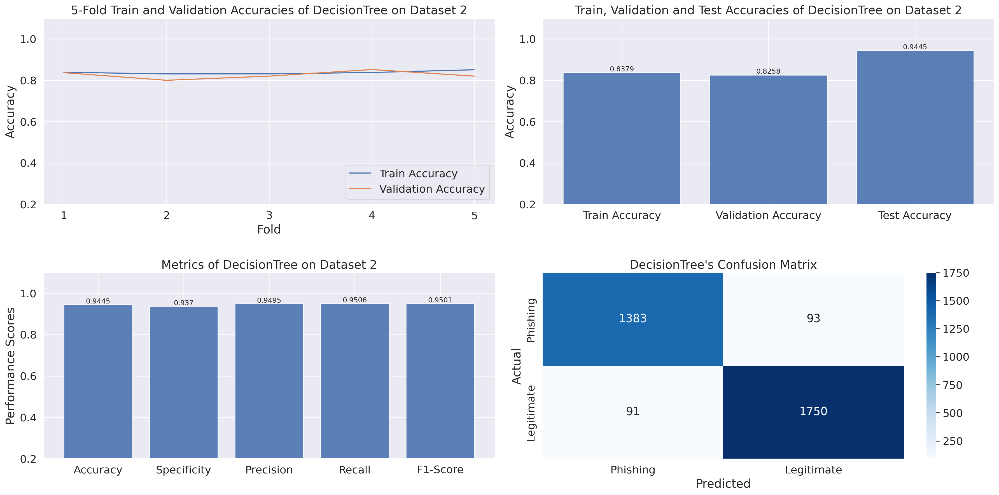


Training SVM on Dataset 2 with RFE...
Time to train SVM on Dataset 2 is: 0.7061357498168945


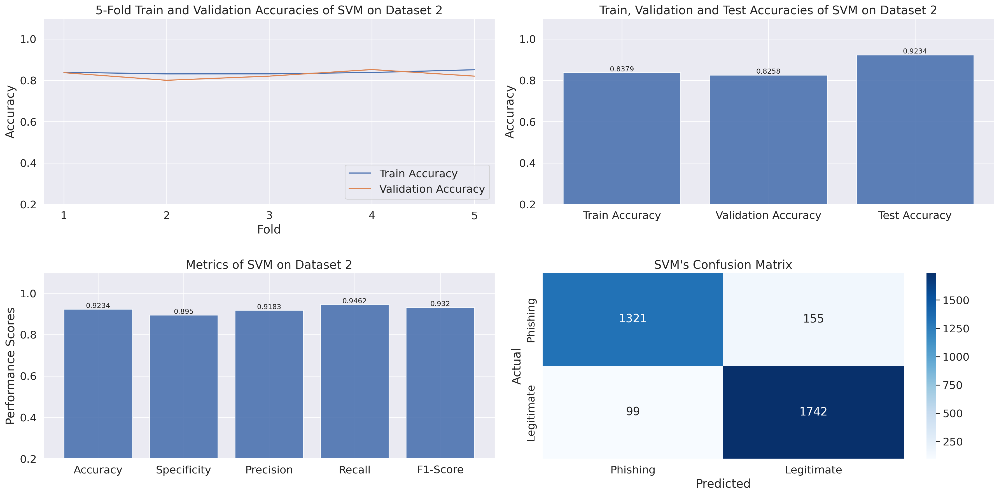


Training RandomForest on Dataset 2 with RFE...
Time to train RandomForest on Dataset 2 is: 2.463956117630005


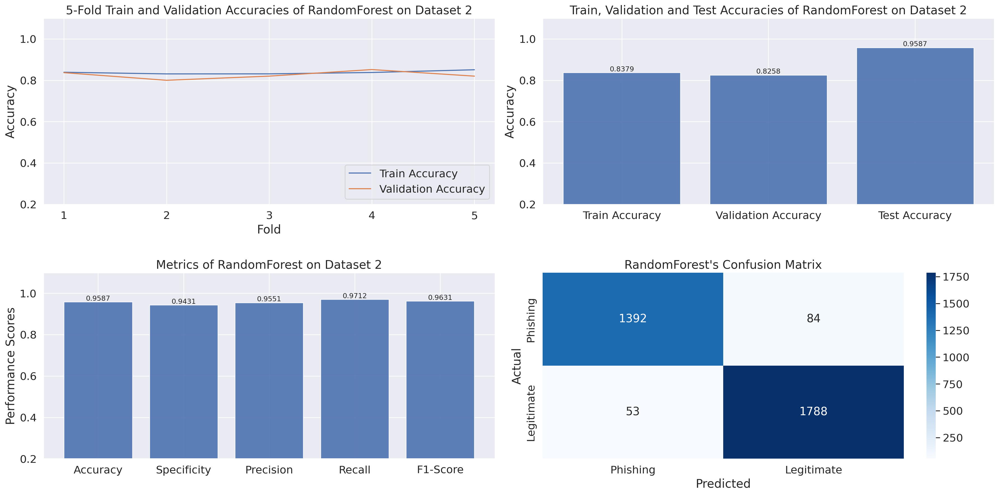


Training NaiveBayes on Dataset 2 with RFE...
Time to train NaiveBayes on Dataset 2 is: 0.04031825065612793


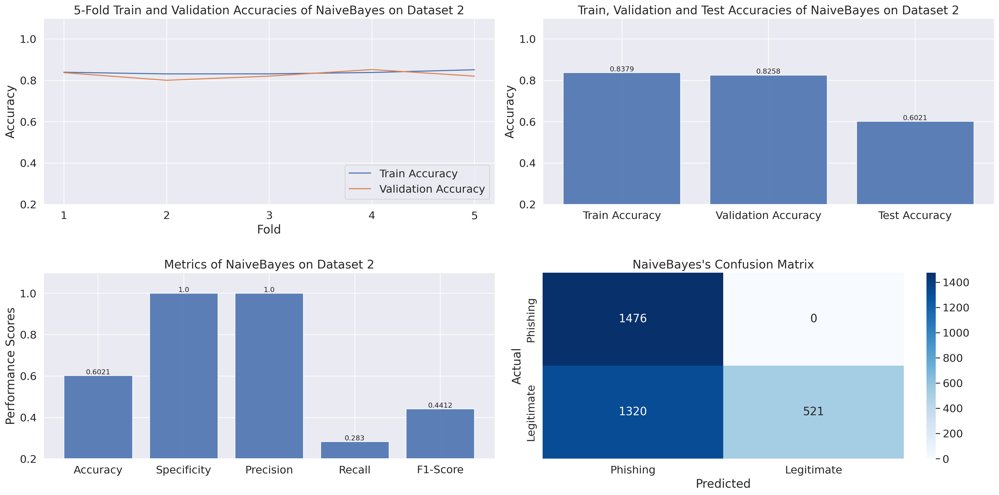


Training KNeighbors on Dataset 2 with RFE...
Time to train KNeighbors on Dataset 2 is: 7.1624720096588135


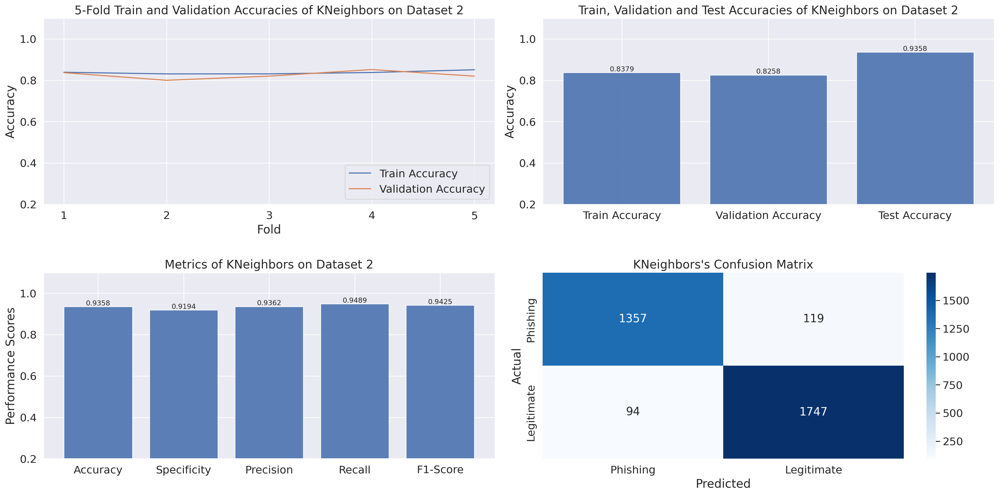


Training Neural Network on Dataset 2 with RFE...
Time to train Neural Network on Dataset 2 is: 170.50149941444397
Unique Predicted Labels: [0 1]
Unique True Labels: [0 1]
Confusion Matrix Shape: (2, 2)


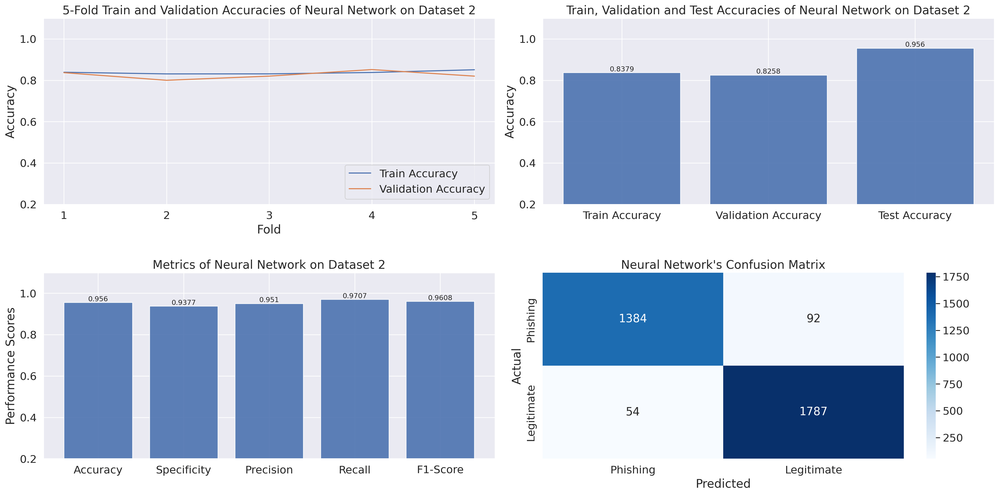

[[1.  0.  1.  ... 1.  1.  0. ]
 [0.  0.  0.  ... 1.  1.  1. ]
 [1.  0.  0.5 ... 0.  1.  0. ]
 ...
 [0.  0.5 0.  ... 0.  0.  0. ]
 [0.5 0.5 1.  ... 0.  1.  0. ]
 [1.  0.5 1.  ... 0.  0.  0. ]]

Number of features selected by Recursive Feature Elimination for Dataset 3: 6


Training DecisionTree on Dataset 3 with RFE...
Time to train DecisionTree on Dataset 3 is: 0.0120391845703125


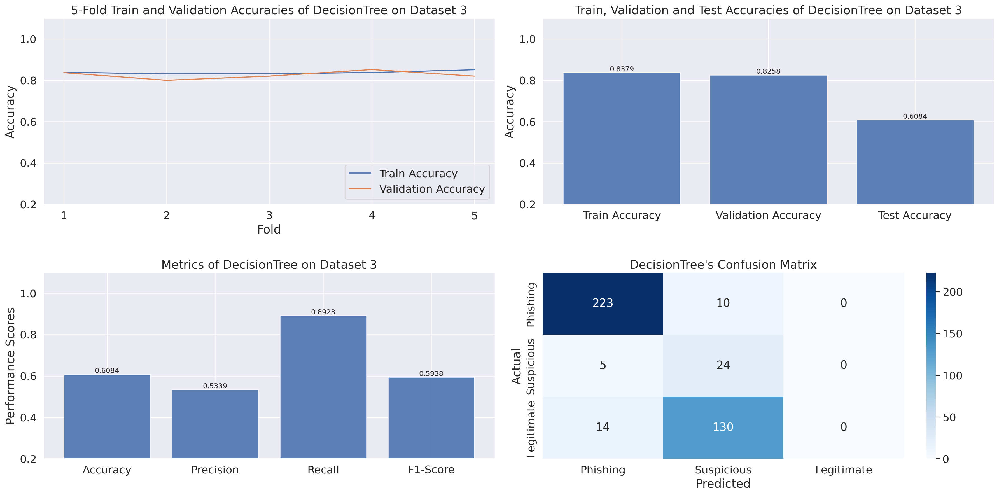


Training SVM on Dataset 3 with RFE...
Time to train SVM on Dataset 3 is: 0.0631098747253418


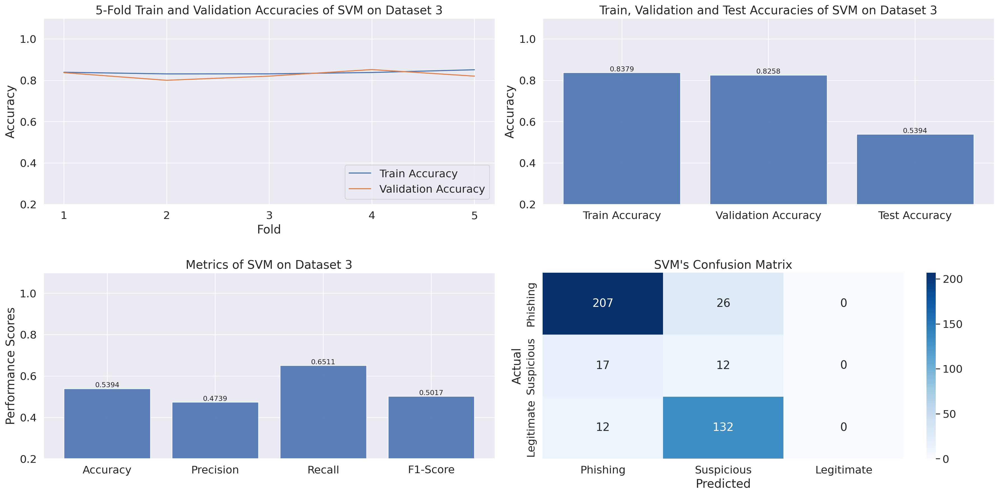


Training RandomForest on Dataset 3 with RFE...
Time to train RandomForest on Dataset 3 is: 0.9645204544067383


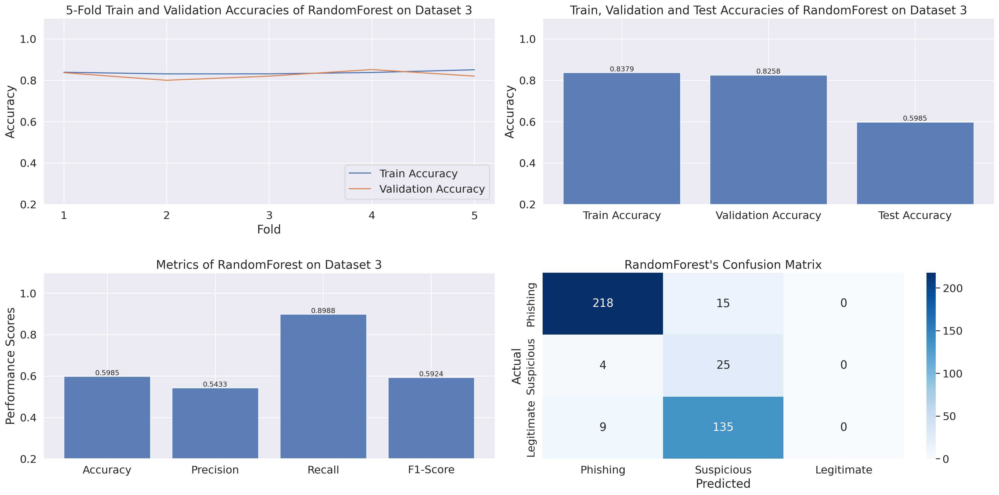


Training NaiveBayes on Dataset 3 with RFE...
Time to train NaiveBayes on Dataset 3 is: 0.014211416244506836


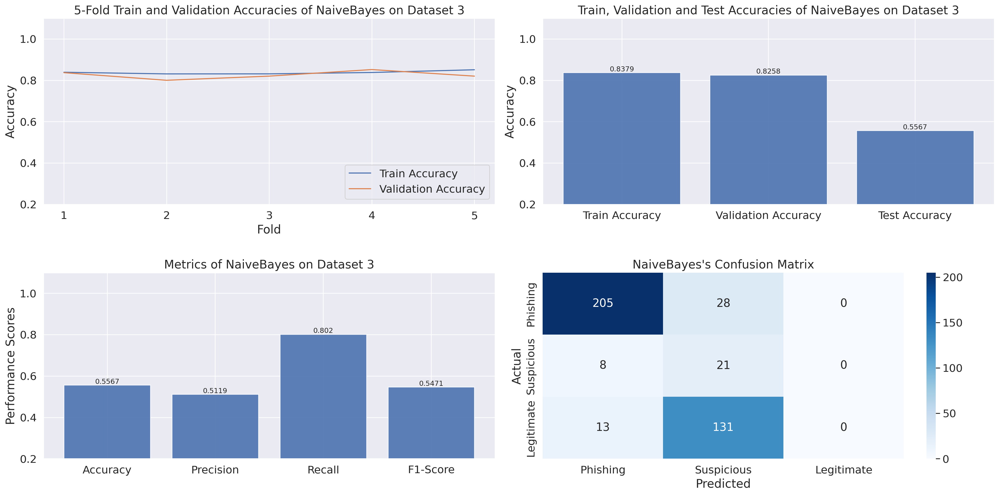


Training KNeighbors on Dataset 3 with RFE...
Time to train KNeighbors on Dataset 3 is: 0.26431918144226074


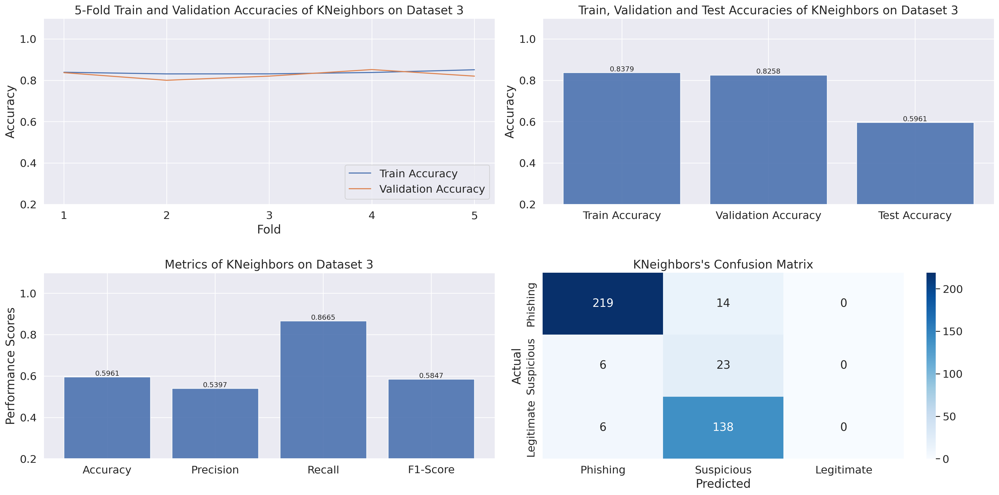


Training Neural Network on Dataset 3 with RFE...
Time to train Neural Network on Dataset 3 is: 28.145684957504272
Unique Predicted Labels: [0 1 2]
Unique True Labels: [0 1 2]
Confusion Matrix Shape: (3, 3)


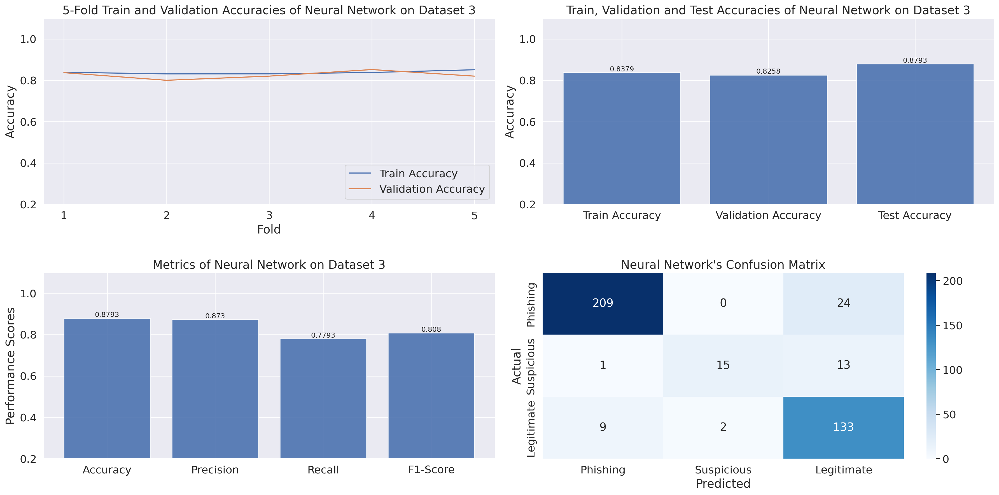

Best Model:
-----------
Model: RandomForest
Dataset: 1
F1 Score: 0.9822


In [15]:
def main_with_rfe():
    np.random.seed(1)
    classifiers = ['DecisionTree', 'SVM', 'RandomForest', 'NaiveBayes', 'KNeighbors', 'Neural Network']
    performance_metrics = []

    for i in range(1, 4):  # Adjust the range for multiple datasets
        dataset, features_dataset, labels_dataset, feature_names_dataset, num_classes = get_data(i)
        selected_features, rfecv = RecursiveFeatureElimination(features_dataset, labels_dataset, feature_names_dataset)
        selected_feats = dataset[selected_features].values
        train, test, train_labels, test_labels = train_test_split(selected_feats, labels_dataset, test_size=0.3, random_state=np.random.seed(173))

        print(f'\nNumber of features selected by Recursive Feature Elimination for Dataset {i}: {rfecv.n_features_}\n')
        for classifier in classifiers:
            print(f'\nTraining {classifier} on Dataset {i} with RFE...')
            metrics = train_and_evaluate_with_rfe(classifier, i, train, train_labels, test, test_labels, num_classes, rfecv.n_features_)
            metrics['model'] = classifier
            metrics['dataset'] = i
            performance_metrics.append(metrics)

    # Convert to DataFrame for easier comparison
    df = pd.DataFrame(performance_metrics)
    model_name, dataset_number = print_best_model(df)

if __name__ == "__main__":
    main_with_rfe()
